# Holistic Health Group Project

## Project Set-Up

### Create Git Repository

```
cd "./Data Science/M6006_assignment3_23407618514"
git clone https://github.com/tabsbower/M6006_assignment3_23407618514
```

### Purpose of the project

The purpose of this project is to discover which variables, or comnbination of variables, are the best predictors of overall health score in order to make suggestions about where real-world interventions could be deployed.

## Introduction

### Description of Dataset

### Research questions

- How do lifestyle factors (smoking, alcohol, nutrition) predict health outcomes?
- Are mental well-being factors (sleep, mindfulness, stress) associated more or less than physical factors (nutrition, excersise, hydration) with health?
- Can we predict whether someone is a ....

#### Hypothesis

Sleep, Stress, and Mindfulness are more influential predictors of Overall Health Score than physical factors.

### Load Relevant Libraries and the Data

In [ ]:
#import relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from matplotlib.colors import ListedColormap
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns 
from sklearn.linear_model import LogisticRegression 


In [2]:
#load data
df = pd.read_csv('holistic_health_lifestyle_dataset.csv')
df.head()

,Physical_Activity,Nutrition_Score,Stress_Level,Mindfulness,Sleep_Hours,Hydration,BMI,Alcohol,Smoking,Overall_Health_Score,Health_Status
0,54.934283,5.643011,5.696572,0.000000,6.292214,2.578565,24.275932,4.280610,8.984006,36.950187,Poor
1,42.234714,6.389001,5.566647,4.450144,8.519054,2.448713,25.970141,7.461846,3.223304,55.167774,Average
2,57.953771,5.805238,3.126960,9.129716,6.702720,3.261433,25.193857,0.000000,4.600482,78.304426,Good
3,75.460597,7.220836,6.159168,16.496689,7.135854,3.726265,19.527300,9.958423,3.947706,94.018274,Good
4,40.316933,9.394357,2.019835,25.241623,8.076086,3.049478,23.348229,4.320347,8.084322,100.000000,Good


In [3]:
#create a numeric version of the Health_Status column
df['Health_Status_numeric'] = df['Health_Status'].map({'Poor': 1, 'Average': 2, 'Good':3 })
df.head()

,Physical_Activity,Nutrition_Score,Stress_Level,Mindfulness,Sleep_Hours,Hydration,BMI,Alcohol,Smoking,Overall_Health_Score,Health_Status,Health_Status_numeric
0,54.934283,5.643011,5.696572,0.000000,6.292214,2.578565,24.275932,4.280610,8.984006,36.950187,Poor,1
1,42.234714,6.389001,5.566647,4.450144,8.519054,2.448713,25.970141,7.461846,3.223304,55.167774,Average,2
2,57.953771,5.805238,3.126960,9.129716,6.702720,3.261433,25.193857,0.000000,4.600482,78.304426,Good,3
3,75.460597,7.220836,6.159168,16.496689,7.135854,3.726265,19.527300,9.958423,3.947706,94.018274,Good,3
4,40.316933,9.394357,2.019835,25.241623,8.076086,3.049478,23.348229,4.320347,8.084322,100.000000,Good,3


## Clean and Explore the Data

### Exploring the Data

   | Column Name            | Description     |
   | ---------------------- | --------------- |
   | Physical_Activity      | Minutes of moderate to vigorous exercise per day (0–120)     |
   | Nutrition_Score        | Diet quality (0–10) based on nutrient density, balance, and variety    |
   | Stress_Level           | Self-reported stress (1–10), where 10 = very high stress|
   | Mindfulnes             | Minutes per day spent in meditation, journaling, or mindful activity (0–60)         |
   | Sleep_Hours            | Average hours of sleep per night (3–10)        |
   | Hydration              | Liters of water consumed per day (0.5–5.0)    |
   | BMI                    | Body Mass Index (18–40)      |
   | Alcohol                | Units of alcohol per week (0–20)  |
   | Smoking                | Cigarettes per day (0–30) |
  
 

We will now explore the data using .describe(), .info() and shape

In [4]:
df.describe()

,Physical_Activity,Nutrition_Score,Stress_Level,Mindfulness,Sleep_Hours,Hydration,BMI,Alcohol,Smoking,Overall_Health_Score,Health_Status_numeric
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,45.047069,6.966599,4.987202,15.224636,7.000194,2.503302,24.095086,3.523663,5.706911,78.227945,2.634100
std,19.832871,1.883295,1.938195,9.454891,1.468580,0.801660,3.356663,3.270784,5.000260,19.697853,0.561826
min,0.000000,0.000000,1.000000,0.000000,3.000000,0.500000,18.000000,0.000000,0.000000,2.217088,1.000000
25%,31.548189,5.675978,3.599696,8.053871,6.003898,1.958461,21.653393,0.298894,1.065818,64.627060,2.000000
50%,44.948100,7.031693,4.988464,14.896178,7.014341,2.506579,24.072122,2.980658,4.954994,81.118118,3.000000
75%,58.421618,8.387730,6.327795,21.790305,8.025752,3.052666,26.380536,5.706382,8.991626,97.972163,3.000000
max,120.000000,10.000000,10.000000,52.278333,10.000000,5.000000,36.376168,18.040621,27.978693,100.000000,3.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Physical_Activity      10000 non-null  float64
 1   Nutrition_Score        10000 non-null  float64
 2   Stress_Level           10000 non-null  float64
 3   Mindfulness            10000 non-null  float64
 4   Sleep_Hours            10000 non-null  float64
 5   Hydration              10000 non-null  float64
 6   BMI                    10000 non-null  float64
 7   Alcohol                10000 non-null  float64
 8   Smoking                10000 non-null  float64
 9   Overall_Health_Score   10000 non-null  float64
 10  Health_Status          10000 non-null  object 
 11  Health_Status_numeric  10000 non-null  int64  
dtypes: float64(10), int64(1), object(1)
memory usage: 937.6+ KB


From the above we can see that the dataset has no NaN values that need to be dealt with.

We will now rename the columns in our dataset to make the data more readable.

### Clean the Data

We did not adopt any cleaning techniques on this data as there were no missing values and we were satisfied with labels

## Exploratory Data Analysis
- visualising distributions
- correlation heatmaps
- group compaisions 

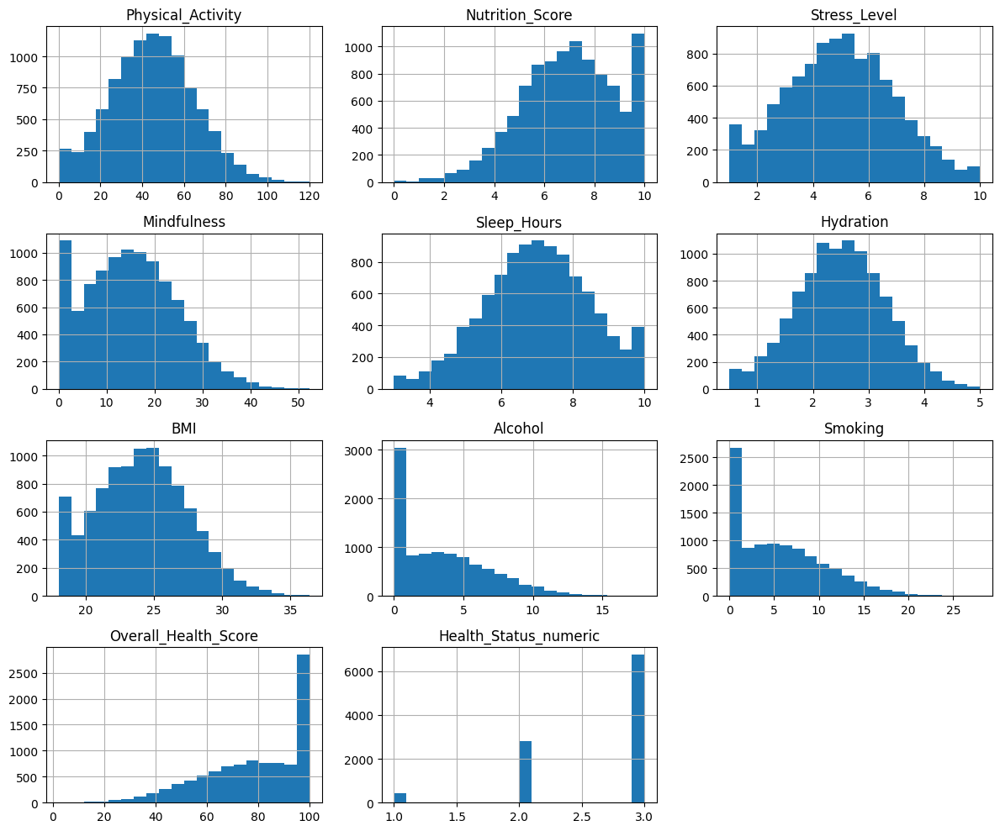

In [6]:
#plot the distribution of each column
df.hist(figsize=(12, 10), bins=20)
plt.tight_layout()
plt.show()

### Variable transformation

#### Binarising Smoking and Drinking

In [7]:
df['Alcohol_binary'] = df['Alcohol'].apply(lambda x: 1 if x > 0 else 0)
df['Smoking_binary'] = df['Smoking'].apply(lambda x: 1 if x > 0 else 0)

df[['Alcohol_binary', 'Smoking_binary']].mean()

Alcohol_binary    0.7726
Smoking_binary    0.8004
dtype: float64

#### Grouped Variables

In [8]:
# Physical factors group
physical_factors = [
    'Smoking',
    'Alcohol',
    'Nutrition_Score',
    'Physical_Activity',
    'BMI',
    'Hydration']

physical_df = df[physical_factors]

In [9]:
df['Lifestyle_Index'] = (
    df['Nutrition_Score'] +
    df['Physical_Activity'] +
    df['Hydration'] -
    df['Smoking'] -
    df['Alcohol'] )

In [10]:
# Mental factors group
mental_factors = [
    'Mindfulness',
    'Sleep_Hours',
    'Stress_Level']

mental_df = df[mental_factors]

In [11]:
df['Mental_Index'] = (
    df['Sleep_Hours'] +
    df['Mindfulness'] -
    df['Stress_Level'])

In [12]:
df['Mental_Index'] = (df['Sleep_Hours'] + df['Mindfulness'] - df['Stress_Level'])

In [13]:
physical_df = df[physical_factors].copy()
mental_df = df[mental_factors].copy()

### Correlation

#### Heatmap

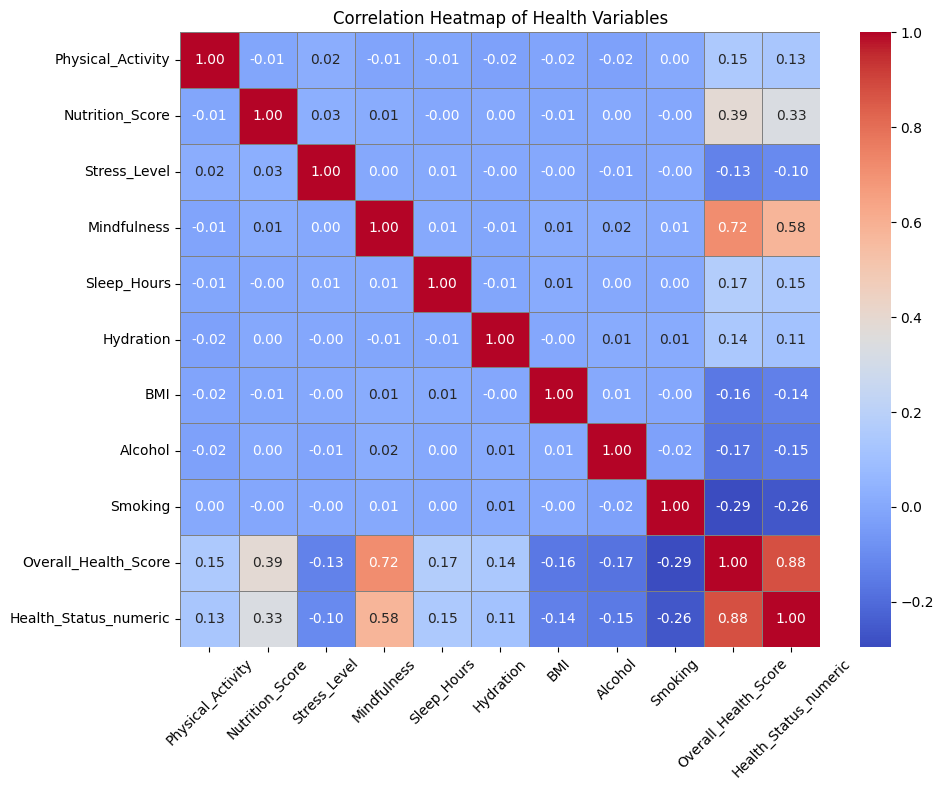

In [14]:
columns = ['Physical_Activity', 'Nutrition_Score', 'Stress_Level', 'Mindfulness', 'Sleep_Hours', 'Hydration', 'BMI', 'Alcohol', 'Smoking', 'Overall_Health_Score', 'Health_Status_numeric']   
corr_matrix = df[columns].corr() # Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, linecolor='gray')
plt.title("Correlation Heatmap of Health Variables")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### Pairplot

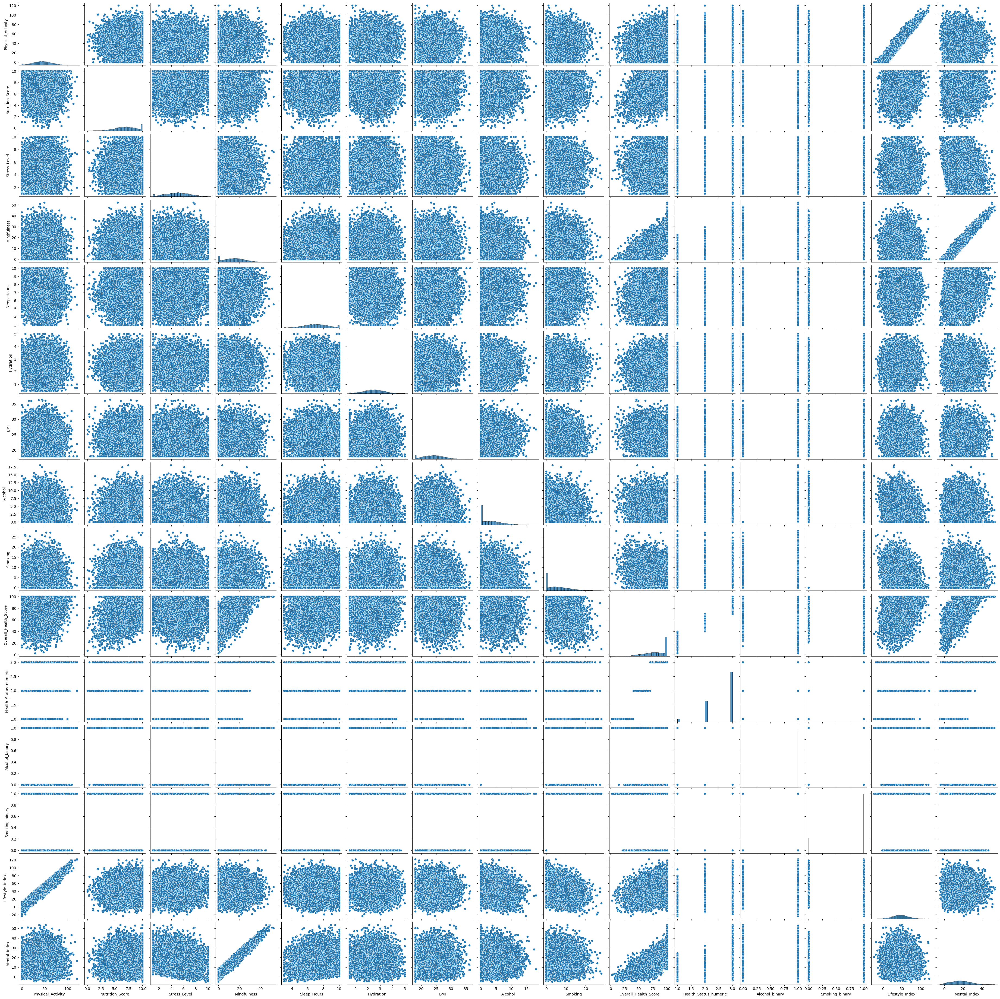

In [15]:
sns.pairplot(df)

C:\Users\zhahla.mohamed\AppData\Local\Temp\ipykernel_17016\3356496728.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([df['BMI'], df['Nutrition_Score']], labels=['BMI', 'Nutrition'])


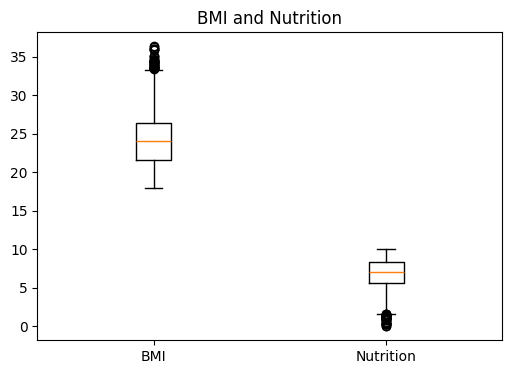

In [16]:
plt.figure(figsize=(6, 4))
plt.boxplot([df['BMI'], df['Nutrition_Score']], labels=['BMI', 'Nutrition'])
plt.title('BMI and Nutrition')
plt.show()

#### Group Comparisons

# Regression Analysis on the Data

## Simple Linear Regression

### Comparing the variable's infuence of the variables over predicting Overall Health Score

#### R-squared

In [17]:
predictors = ['Sleep_Hours', 'Stress_Level', 'Nutrition_Score', 'Physical_Activity', 
              'BMI', 'Hydration', 'Mindfulness', 'Alcohol', 'Smoking']

for var in predictors:
    X = df[[var]]
    y = df['Overall_Health_Score']

    #train/test split (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42)

    #fit model on training only
    model = LinearRegression()
    model.fit(X_train, y_train)

    #predict on test set
    y_pred = model.predict(X_test)

    #evaluate on the test set
    test_r2 = r2_score(y_test, y_pred)

    print(f"{var}: Test R-squared = {test_r2:.4f}")

Sleep_Hours: Test R-squared = 0.0292
Stress_Level: Test R-squared = 0.0113
Nutrition_Score: Test R-squared = 0.1380
Physical_Activity: Test R-squared = 0.0213
BMI: Test R-squared = 0.0267
Hydration: Test R-squared = 0.0138
Mindfulness: Test R-squared = 0.5099
Alcohol: Test R-squared = 0.0359
Smoking: Test R-squared = 0.1045


#### Simple Linear Regression

In [18]:
#BMI
X = df[('BMI')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.026
Model:                              OLS   Adj. R-squared:                  0.026
Method:                   Least Squares   F-statistic:                     263.6
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           1.57e-58
Time:                          21:13:44   Log-Likelihood:                -43864.
No. Observations:                 10000   AIC:                         8.773e+04
Df Residuals:                      9998   BIC:                         8.775e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        100.8907      1.409

In [19]:
#Alcohol
X = df[('Alcohol')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.031
Model:                              OLS   Adj. R-squared:                  0.030
Method:                   Least Squares   F-statistic:                     314.8
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           2.22e-69
Time:                          21:13:44   Log-Likelihood:                -43839.
No. Observations:                 10000   AIC:                         8.768e+04
Df Residuals:                      9998   BIC:                         8.770e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         81.9357      0.285

In [20]:
#Smoking
#BMI
X = df[('Smoking')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.087
Model:                              OLS   Adj. R-squared:                  0.087
Method:                   Least Squares   F-statistic:                     949.0
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):          3.66e-199
Time:                          21:13:44   Log-Likelihood:                -43541.
No. Observations:                 10000   AIC:                         8.709e+04
Df Residuals:                      9998   BIC:                         8.710e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         84.8472      0.286

In [21]:
#Physical Activity
X = df[('Physical_Activity')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.021
Model:                              OLS   Adj. R-squared:                  0.021
Method:                   Least Squares   F-statistic:                     217.8
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           8.88e-49
Time:                          21:13:44   Log-Likelihood:                -43886.
No. Observations:                 10000   AIC:                         8.778e+04
Df Residuals:                      9998   BIC:                         8.779e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             

In [22]:
#Mindfulness
X = df[('Mindfulness')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.512
Model:                              OLS   Adj. R-squared:                  0.512
Method:                   Least Squares   F-statistic:                 1.051e+04
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):               0.00
Time:                          21:13:44   Log-Likelihood:                -40402.
No. Observations:                 10000   AIC:                         8.081e+04
Df Residuals:                      9998   BIC:                         8.082e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          55.5223      0.

In [23]:
#Stress Level
X = df[('Stress_Level')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.017
Model:                              OLS   Adj. R-squared:                  0.017
Method:                   Least Squares   F-statistic:                     170.0
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           1.50e-38
Time:                          21:13:44   Log-Likelihood:                -43910.
No. Observations:                 10000   AIC:                         8.782e+04
Df Residuals:                      9998   BIC:                         8.784e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           84.7823     

In [24]:
#Sleep hours
X = df[('Sleep_Hours')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.030
Model:                              OLS   Adj. R-squared:                  0.029
Method:                   Least Squares   F-statistic:                     304.3
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           3.80e-67
Time:                          21:13:44   Log-Likelihood:                -43844.
No. Observations:                 10000   AIC:                         8.769e+04
Df Residuals:                      9998   BIC:                         8.771e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          62.0920      0.

In [25]:
#Nutrition
X = df[('Nutrition_Score')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.149
Model:                              OLS   Adj. R-squared:                  0.149
Method:                   Least Squares   F-statistic:                     1747.
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):               0.00
Time:                          21:13:44   Log-Likelihood:                -43189.
No. Observations:                 10000   AIC:                         8.638e+04
Df Residuals:                      9998   BIC:                         8.640e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              50.

In [26]:
#Hydration
X = df[('Hydration')]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.020
Model:                              OLS   Adj. R-squared:                  0.020
Method:                   Least Squares   F-statistic:                     205.9
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):           3.13e-46
Time:                          21:13:44   Log-Likelihood:                -43892.
No. Observations:                 10000   AIC:                         8.779e+04
Df Residuals:                      9998   BIC:                         8.780e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         69.4909      0.639

### Multiple linear regression

In [27]:
X = df[predictors]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.907
Model:                              OLS   Adj. R-squared:                  0.907
Method:                   Least Squares   F-statistic:                 1.082e+04
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):               0.00
Time:                          21:13:44   Log-Likelihood:                -32121.
No. Observations:                 10000   AIC:                         6.426e+04
Df Residuals:                      9990   BIC:                         6.433e+04
Df Model:                             9                                         
Covariance Type:              nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             

In [28]:
X = df[physical_factors]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.336
Model:                              OLS   Adj. R-squared:                  0.336
Method:                   Least Squares   F-statistic:                     842.7
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):               0.00
Time:                          21:13:44   Log-Likelihood:                -41947.
No. Observations:                 10000   AIC:                         8.391e+04
Df Residuals:                      9993   BIC:                         8.396e+04
Df Model:                             6                                         
Covariance Type:              nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             

In [29]:
X = df[mental_factors]
y = df['Overall_Health_Score']

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()

print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     Overall_Health_Score   R-squared:                       0.557
Model:                              OLS   Adj. R-squared:                  0.557
Method:                   Least Squares   F-statistic:                     4194.
Date:                  Sun, 30 Nov 2025   Prob (F-statistic):               0.00
Time:                          21:13:44   Log-Likelihood:                -39920.
No. Observations:                 10000   AIC:                         7.985e+04
Df Residuals:                      9996   BIC:                         7.988e+04
Df Model:                             3                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           46.5692     

#### Training the Data 

In [30]:
#training/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

In [31]:
model = LinearRegression()
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [32]:
y_pred = model.predict(X_test)

In [33]:
train_r2 = model.score(X_train, y_train)
test_r2  = model.score(X_test, y_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("Train R²:", train_r2)
print("Test R²: ", test_r2)
print("RMSE:    ", rmse)

Train R²: 0.5600941922306346
Test R²:  0.5451522443404384
RMSE:     13.277629575287744


In [34]:
#cooefficients
coef_table = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": model.coef_})

print("\nCoefficients:")
print(coef_table)


Coefficients:
        Feature  Coefficient
0         const     0.000000
1   Mindfulness     1.493345
2   Sleep_Hours     2.275639
3  Stress_Level    -1.386053


none of the confidence intervals cross 0, meaning that each variable holds some significance in predicting overall health score

### Logistic Regression
- confusion matrix

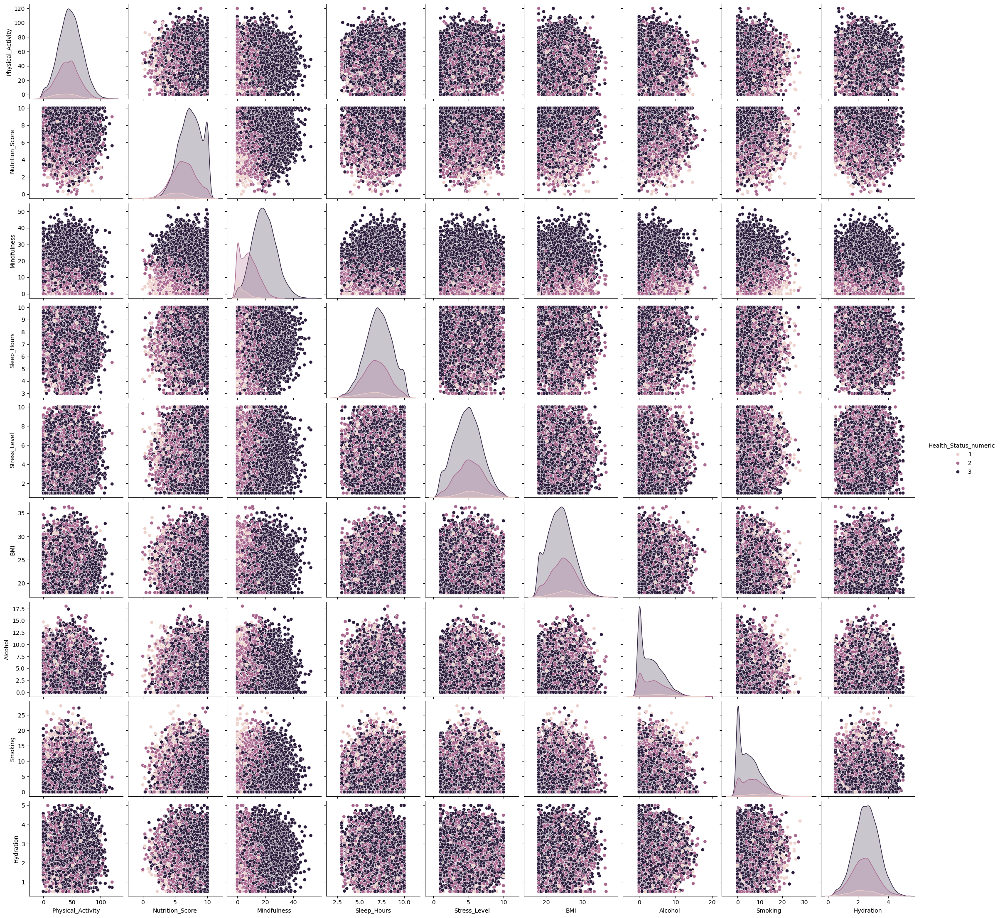

In [84]:
sns.pairplot(df[['Physical_Activity', 'Nutrition_Score','Mindfulness', 'Sleep_Hours', 'Stress_Level','BMI', 'Alcohol', 'Smoking', 'Hydration', 'Health_Status_numeric']], hue='Health_Status_numeric')   

In [37]:
X_log = df[['Physical_Activity', 'Nutrition_Score', 'Stress_Level', 'Mindfulness', 'Sleep_Hours', 'Hydration','BMI', 'Alcohol', 'Smoking']]
y_log = df['Health_Status_numeric']

In [49]:
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_log, y_log, test_size=0.20, random_state= 42,stratify = y_log)

In [ ]:
clf = LogisticRegression(max_iter=2000, random_state=0).fit(X_train_log, y_train_log)

In [56]:
coeff_df = pd.DataFrame(clf.coef_, 
                        columns=X_log.columns, 
                        index=clf.classes_)

coeff_df.index.name = "Health Status"
print(coeff_df)



               Physical_Activity  Nutrition_Score  Stress_Level  Mindfulness  \
Health Status                                                                  
1                      -0.209408        -5.179360      2.076561    -2.078493   
2                      -0.036431        -0.900765      0.340479    -0.365203   
3                       0.245840         6.080125     -2.417040     2.443696   

               Sleep_Hours  Hydration       BMI   Alcohol   Smoking  
Health Status                                                        
1                -3.033990  -4.751507  1.218193  1.559505  1.589663  
2                -0.587274  -0.995208  0.219003  0.261115  0.257106  
3                 3.621264   5.746716 -1.437195 -1.820620 -1.846769  


In [ ]:
y_pred_log = clf.predict(X_test_log)
print("Accuracy:", accuracy_score(y_test_log, y_pred_log))
print("\nClassification Report:\n", classification_report(y_test_log, y_pred_log))
print("\nConfusion Matrix:\n", confusion_matrix(y_test_log, y_pred_log))

Accuracy: 0.993

Classification Report:
               precision    recall  f1-score   support

           1       0.95      0.98      0.96        84
           2       0.99      0.99      0.99       564
           3       1.00      1.00      1.00      1352

    accuracy                           0.99      2000
   macro avg       0.98      0.99      0.98      2000
weighted avg       0.99      0.99      0.99      2000


Confusion Matrix:
 [[  82    2    0]
 [   4  558    2]
 [   0    6 1346]]


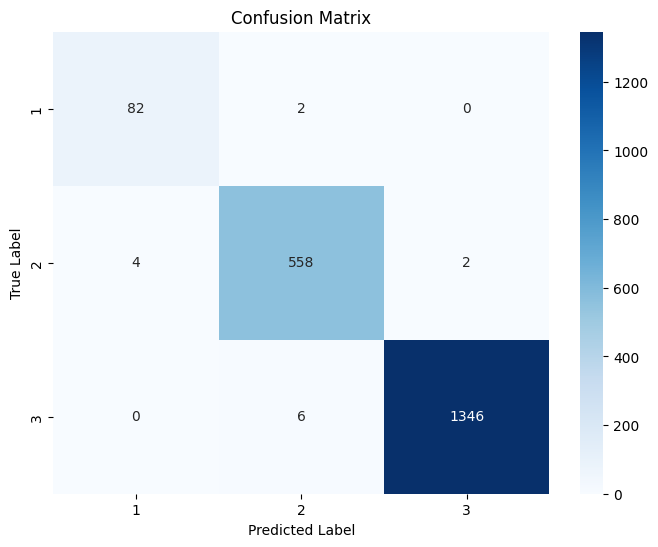

In [69]:
# Confusion matrix 
cm = confusion_matrix(y_test_log, y_pred_log)

# Plotting using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=clf.classes_,
            yticklabels=clf.classes_)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


c:\Users\zhahla.mohamed\Data Science\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


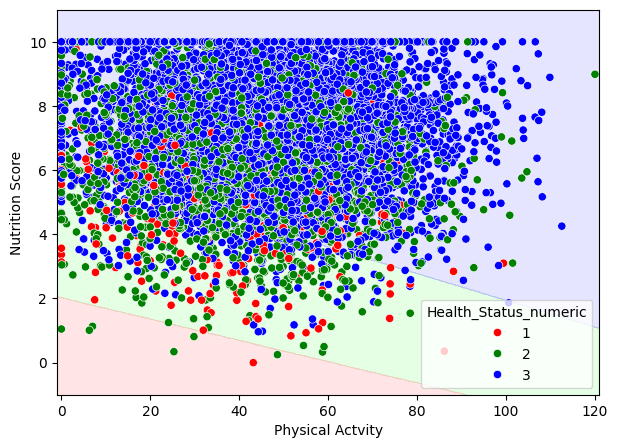

In [83]:
# choosing two features  - we can do this with other features we want to look at more 
feature1= 'Physical_Activity'
feature2= 'Nutrition_Score'

X2 = df[[feature1, feature2]]
y2 = df["Health_Status_numeric"]

X_train2, X_test2, y_train2, y_test2 = train_test_split(
    X2, y2, test_size=0.2, random_state=42, stratify=y2
)

clf2 = LogisticRegression(max_iter=300)
clf2.fit(X_train2, y_train2)

# create grid
x_min, x_max = X_train2.iloc[:,0].min()-1, X_train2.iloc[:,0].max()+1
y_min, y_max = X_train2.iloc[:,1].min()-1, X_train2.iloc[:,1].max()+1
xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 500),
    np.linspace(y_min, y_max, 500)
)

Z = clf2.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(7,5))
plt.contourf(xx, yy, Z, alpha=0.3,
             cmap=ListedColormap(["#FFAAAA","#AAFFAA","#AAAAFF"]))
sns.scatterplot(
    x=X_train2.iloc[:,0], 
    y=X_train2.iloc[:,1],
    hue=y_train2,
    palette=["red","green","blue"]
)
plt.xlabel("Physical Actvity") # Remember to change according to the features you selected
plt.ylabel("Nutrition Score")
plt.show()



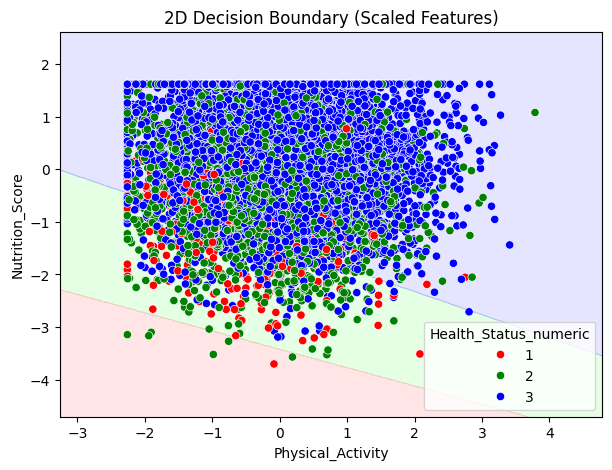

In [86]:
from sklearn.preprocessing import StandardScaler
# choosing two features
feature1 = 'Physical_Activity'
feature2 = 'Nutrition_Score'

X2 = df[[feature1, feature2]]
y2 = df["Health_Status_numeric"]

# Train-test split
X_train2, X_test2, y_train2, y_test2 = train_test_split(
    X2, y2, test_size=0.2, random_state=42, stratify=y2
)

# Scale data
scaler = StandardScaler()
X_train2_scaled = scaler.fit_transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

# Fit model
clf2 = LogisticRegression(max_iter=300)
clf2.fit(X_train2_scaled, y_train2)

# Create grid using TRAINING data
x_min, x_max = X_train2_scaled[:,0].min() - 1, X_train2_scaled[:,0].max() + 1
y_min, y_max = X_train2_scaled[:,1].min() - 1, X_train2_scaled[:,1].max() + 1

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 500),
    np.linspace(y_min, y_max, 500)
)

Z = clf2.predict(np.c_[xx.ravel(), yy.ravel()])            # or Z = clf2.predict(grid_points) if not scaled
Z = Z.reshape(xx.shape)

Z = Z.reshape(xx.shape)

# Plot
plt.figure(figsize=(7,5))
plt.contourf(xx, yy, Z, alpha=0.3,
             cmap=ListedColormap(["#FFAAAA","#AAFFAA","#AAAAFF"]))

sns.scatterplot(
    x=X_train2_scaled[:,0], 
    y=X_train2_scaled[:,1],
    hue=y_train2,
    palette=["red","green","blue"]
)

plt.xlabel(feature1)
plt.ylabel(feature2)
plt.title("2D Decision Boundary (Scaled Features)")
plt.show()


### Comparing Mental vs Physical Predictors 

12. Advanced (Optional)
Only if you want bonus depth:
Standardisation of predictors
PCA on physical + mental factors
Clustering to detect lifestyle patterns

## Make it Shiny

# Discussion of Findings

# Conclusison